In [66]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
    
import matplotlib.pyplot as plt
import cv2
import torch

from facemesh import FaceMesh
from utils import plot as plot_pupils
import numpy as np
import pandas as pd
from tqdm import tqdm
from typing import Optional
from pathlib import Path
import os

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [82]:
class EyesExtractor:
    def __init__(
        self,
        save_folder: Optional[str] = None,
        facemesh_weights: str = "./weights/facemesh.pth",
        device: str = "cpu"
    ):
        self.face_detection_model = cv2.CascadeClassifier("./weights/haarcascade_frontalface_alt.xml")
        self.facemesh =  FaceMesh().to(device)
        self.facemesh.load_weights(facemesh_weights)
        self.left_eye_indices = [33, 7, 163, 144, 145, 153, 154, 155,
                                 246, 161, 160, 159, 158, 157, 173, 133]
        self.right_eye_indices = [249, 263, 362, 373, 374, 380, 381, 382,
                                  384, 385, 386, 387, 388, 390, 398, 466]
        if save_folder is not None:
            self.save_folder = Path(save_folder)
            if not os.path.exists(save_folder):
                os.mkdir(save_folder)

    def get_eye_crop(self, points: np.array, img: np.array, which_eye: str):
        h, w, _ = img.shape
        sorted_point_x = sorted(points, key = lambda x: x[0])
        sorted_point_y = sorted(points, key = lambda x: x[1])
        left_point = sorted_point_x[0]
        right_point = sorted_point_x[-1]
        up_point = sorted_point_y[0]
        down_point = sorted_point_y[-1]
        multiplicator = 1/2
        margin_x_left = max(64 - (right_point[0] - left_point[0]), 0) * multiplicator
        margin_x_right = max(64 - (right_point[0] - left_point[0]), 0) * (1 - multiplicator)
        margin_y = max(64 - (down_point[1] - up_point[1]), 0) / 2
        min_x, max_x = max(0, int(left_point[0] - margin_x_left)), min(w, int(right_point[0] + margin_x_right))
        min_y, max_y = max(0, int(up_point[1] - margin_y)), min(h, int(down_point[1] + margin_y))
        img_eye = img[min_y: max_y, min_x: max_x, :]
        left_top_point = (min_x, min_y) 
        return img_eye, left_top_point


    def get_pupil(self, points: np.array, img: np.array, which_eye: str, plot: bool = False):
        img_eye, left_top_point = self.get_eye_crop(points, img, which_eye = which_eye)
        eye_contour, iris = self.pupil_detector(cv2.cvtColor(img_eye, cv2.COLOR_RGB2BGR))
        if plot:
            plot_pupils(img_eye, iris, eye_contour, plot_eye=False)
        eye_contour, iris = eye_contour.reshape((-1, 3)), iris.reshape((-1, 3))
        eye_contour[:, 0] = eye_contour[:, 0] + left_top_point[0]
        eye_contour[:, 1] = eye_contour[:, 1] + left_top_point[1]
        iris[:, 0] = iris[:, 0] + left_top_point[0]
        iris[:, 1] = iris[:, 1] + left_top_point[1]
        return iris, eye_contour

    def extract_eyes(self, img_path: str, plot: bool = False):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.flip(img, 1)
        if plot:
            plt.imshow(img)
            plt.show()
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        face_rects = self.face_detection_model.detectMultiScale(
            gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30)
        )
        no_face_list = []
        if len(face_rects) > 0:
            if len(face_rects) > 1:
                face_rect = sorted(face_rects, key = lambda x: x[2] * x[3])[-1]
            else:
                face_rect = face_rects[0]
            face_crop = img[
                max(face_rect[1] - face_rect[3] // 4, 0) : min(face_rect[1] + face_rect[3] + face_rect[3] // 4, img.shape[1]),
                max(face_rect[0] - face_rect[2] // 4, 0) : min(face_rect[0] + face_rect[2] + face_rect[2] // 4, img.shape[1]), :
            ]
        else:
            return False, None, None
        face_crop = cv2.resize(face_crop, (192, 192), interpolation = cv2.INTER_LINEAR)
        facemesh_points = self.facemesh.predict_on_image(face_crop).numpy()
        left_eye_points = facemesh_points[self.left_eye_indices]
        right_eye_points = facemesh_points[self.right_eye_indices]
        img_eye_left, _ = self.get_eye_crop(left_eye_points, face_crop, which_eye = "left")
        img_eye_right, _ = self.get_eye_crop(right_eye_points, face_crop, which_eye = "right")
        if self.save_folder is not None:
            img_eye_left = cv2.cvtColor(img_eye_left, cv2.COLOR_RGB2BGR)
            new_img_name = Path(img_path).stem + "_left.png"
            left_path = str(Path(self.save_folder / new_img_name).absolute())
            cv2.imwrite(left_path, img_eye_left)
            
            img_eye_right = cv2.cvtColor(img_eye_right, cv2.COLOR_RGB2BGR)
            new_img_name = Path(img_path).stem + "_right.png"
            right_path = str(Path(self.save_folder / new_img_name).absolute())
            cv2.imwrite(right_path, img_eye_right)
        
        if plot:
            plt.title("Left eye")
            plt.imshow(img_eye_left)
            plt.show()
            plt.title("Right eye")
            plt.imshow(img_eye_right)
            plt.show()
            plt.imshow(face_crop, zorder=1)
            x, y = facemesh_points[:, 0], facemesh_points[:, 1]
            plt.scatter(x, y, zorder=2, s=1.0)
            plt.show()
        return True, left_path, right_path

In [102]:
extractor = EyesExtractor(save_folder = dataset_folder)

In [15]:
df = pd.read_csv("../data/data_tobii.csv")

/tmp/ipykernel_110768/3527429219.py:1: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("../data/data_tobii.csv")


In [25]:
df["full_name"] = df["paths"].apply(lambda x: "#".join(x.split("/")[2:]))

In [41]:
test_df = pd.read_csv("./tobii_test_sub_upd.csv")
val_df = pd.read_csv("./tobii_val_sub_upd.csv")
train_df = pd.read_csv("./tobii_train_sub_upd.csv")

In [51]:
def correct_df(df):
    df.loc[df["y_normalized"] == 1.5, ['tob_right_y', 'tob_left_y']] = 1.5
    return df.drop(columns = ["y_normalized"])

In [52]:
needed_columns = ["paths", "tob_left_x", "tob_left_y", "tob_right_x", "tob_right_y", "y_normalized"]
df_both_eyes_train = df.merge(train_df, on = "full_name", suffixes = ["_old", ""])[needed_columns]
df_both_eyes_train = correct_df(df_both_eyes_train)
df_both_eyes_val = df.merge(val_df, on = "full_name", suffixes = ["_old", ""])[needed_columns]
df_both_eyes_val = correct_df(df_both_eyes_val)
df_both_eyes_test = df.merge(test_df, on = "full_name", suffixes = ["_old", ""])[needed_columns]
df_both_eyes_test = correct_df(df_both_eyes_test)

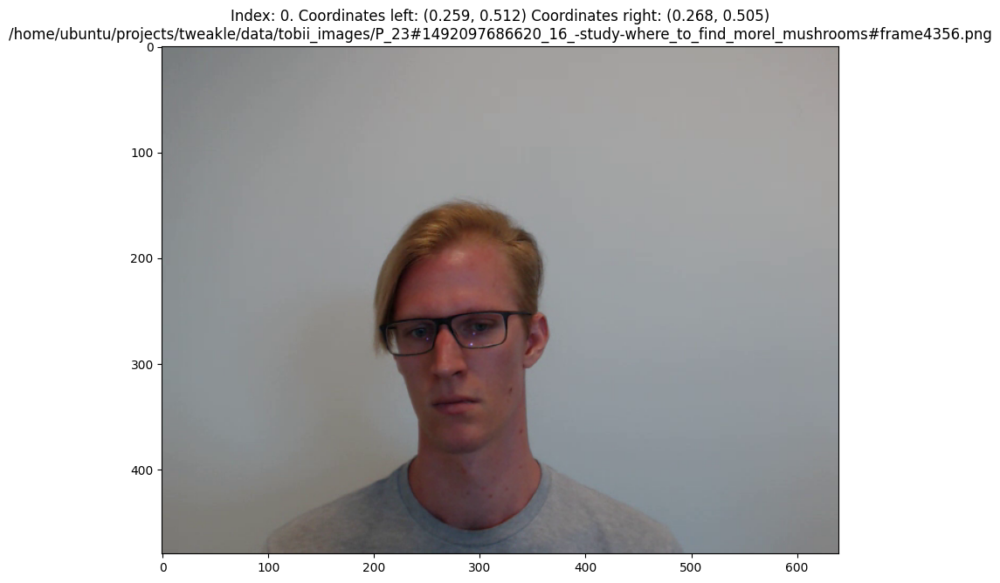

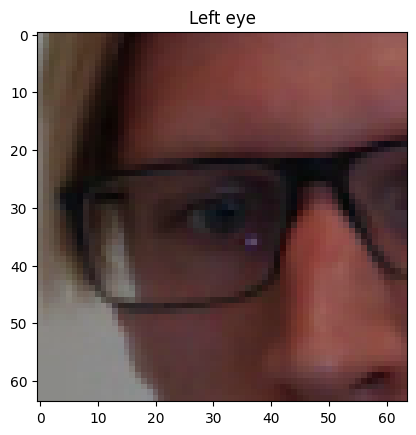

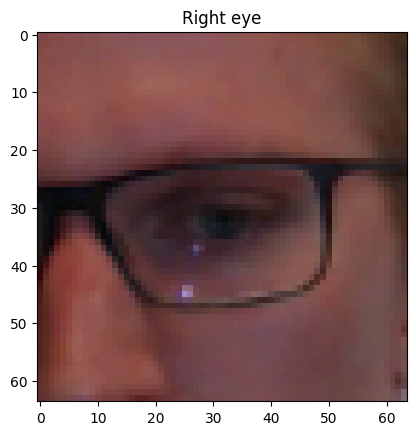

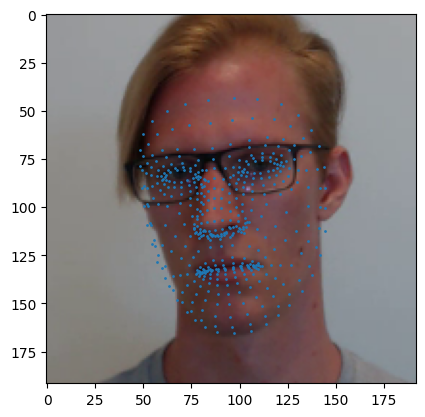

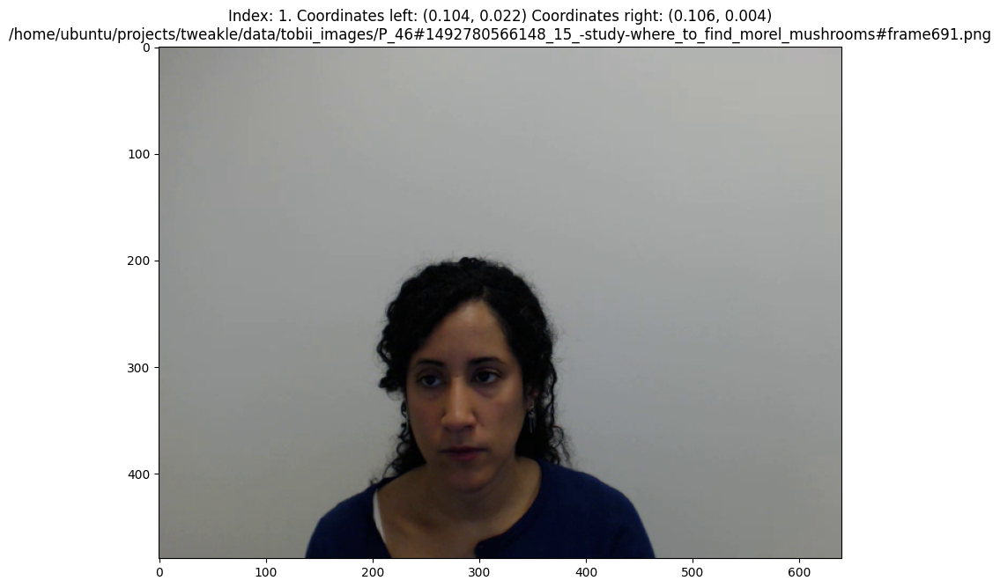

...

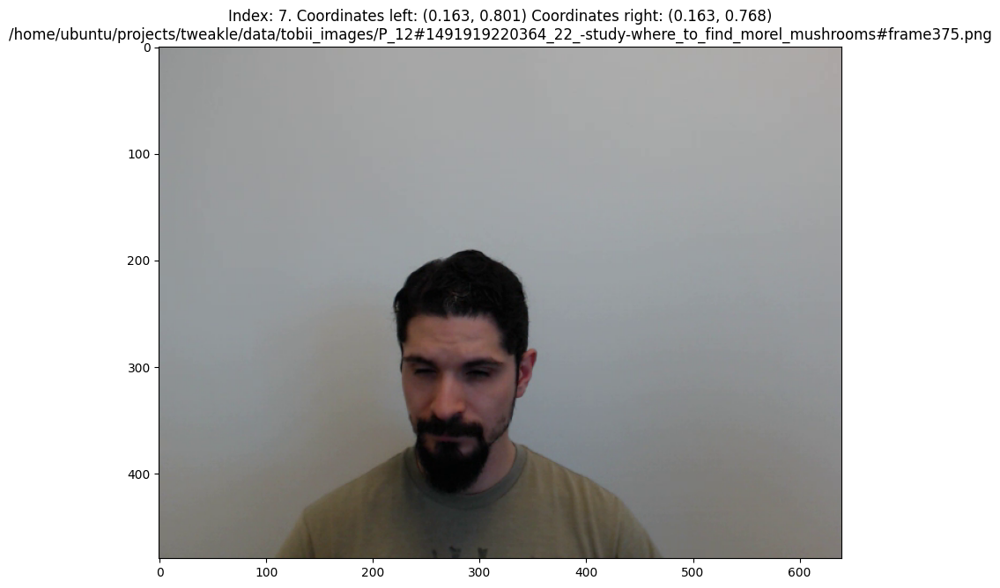

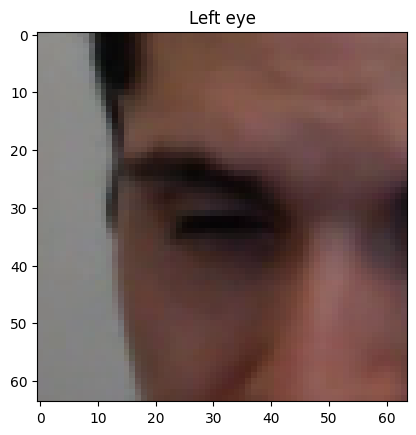

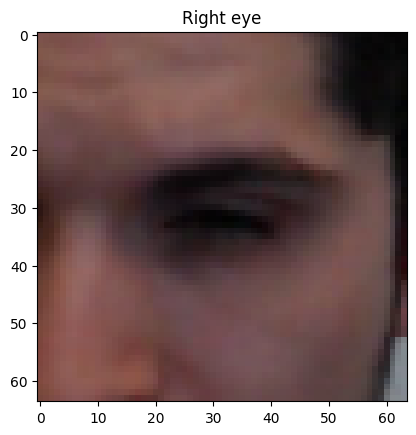

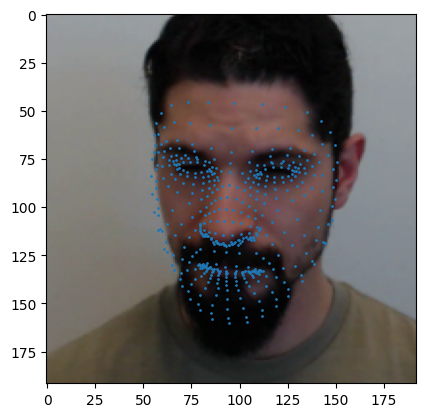

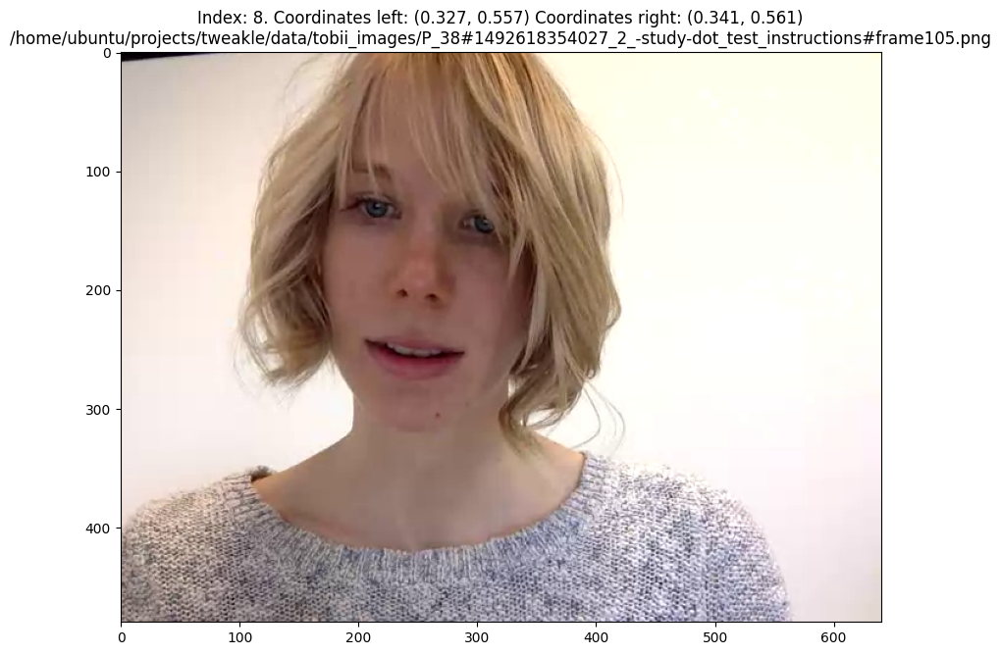

FAILED


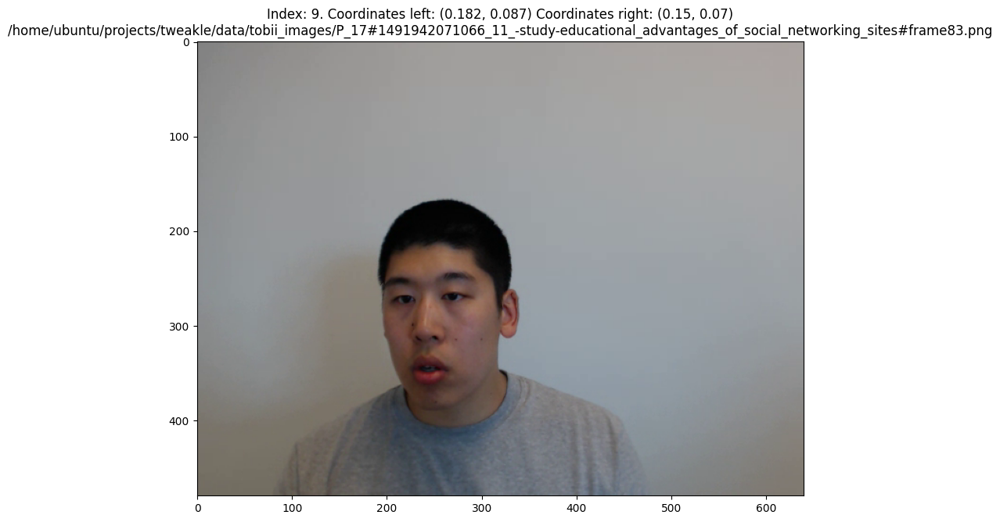

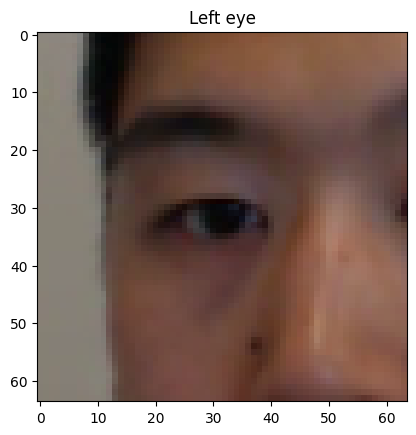

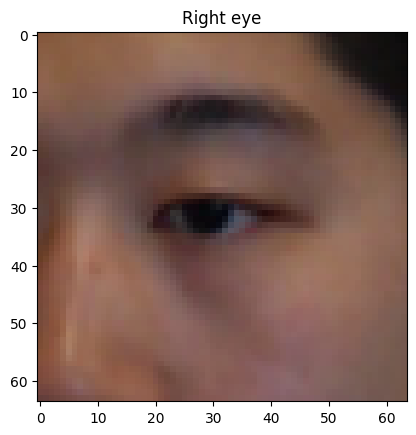

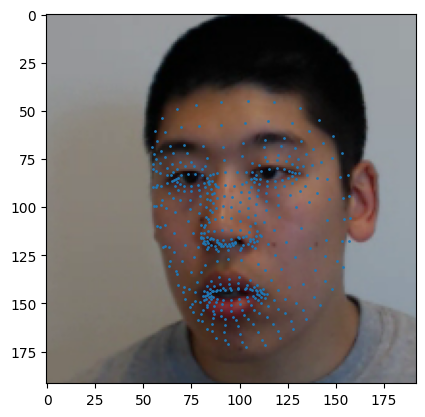

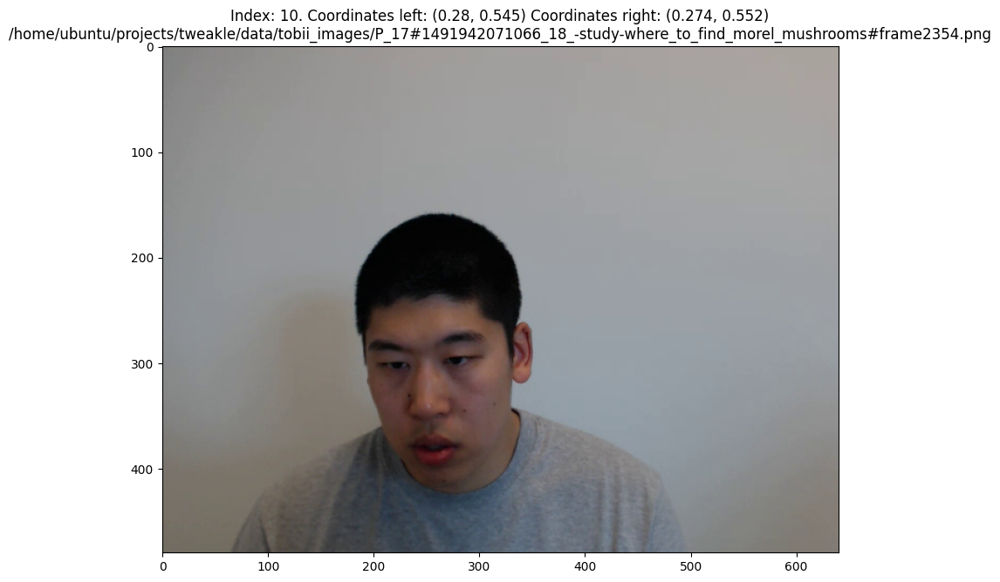

...

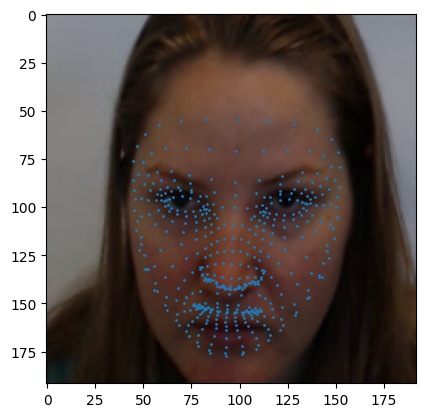

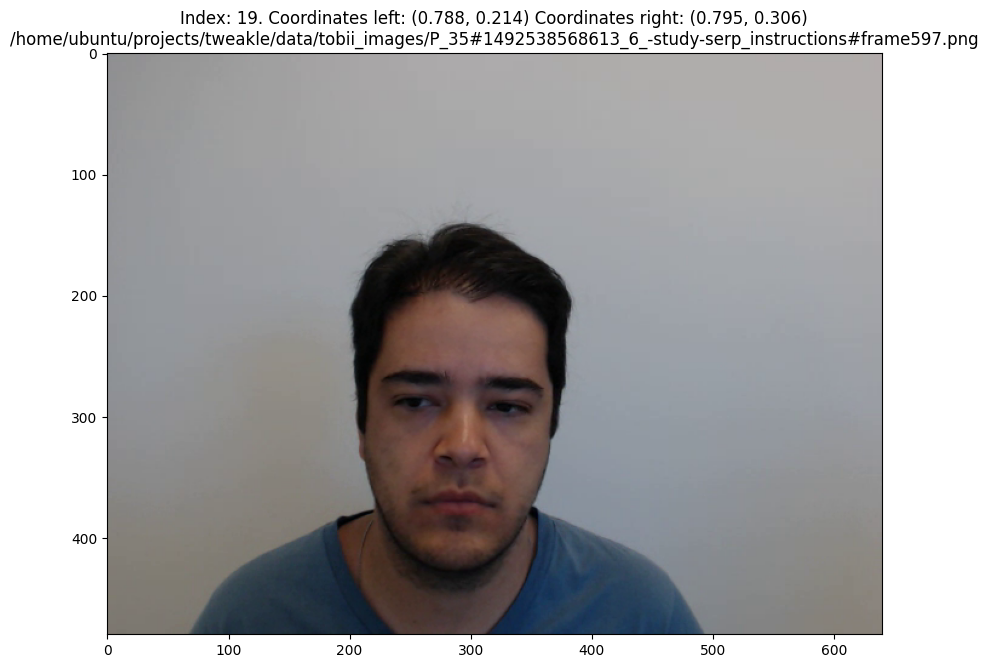

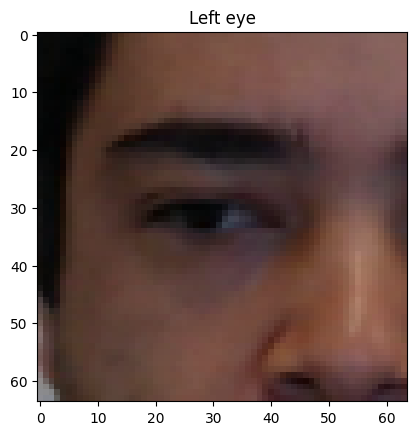

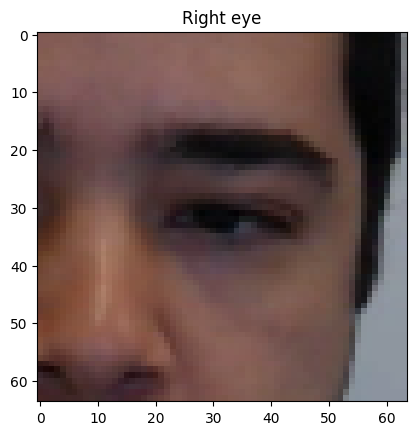

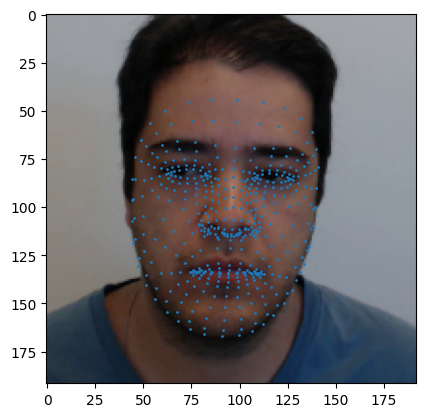

In [46]:
random_subset = df_both_eyes_train.sample(20)
num_failed = 0
for i in range(random_subset.shape[0]):
    row = random_subset.iloc[i]
    path = row['paths']
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 8))
    plt.title(f'Index: {i}. Coordinates left: ({round(row["tob_left_x"],3)}, {round(row["tob_left_y"],3)}) '
              f'Coordinates right: ({round(row["tob_right_x"],3)}, {round(row["tob_right_y"],3)})\n{row["paths"]}')
    res = extractor.extract_eyes(path, plot = True)
    if not res:
        num_failed += 1
        print("FAILED")
    plt.show()

In [101]:
# !rm -r $dataset_folder

In [91]:
!mkdir $dataset_folder

In [117]:
num_failed = 0
res_dict = {
    "paths": [],
    "x_normalized": [],
    "y_normalized": [],
    "if_left": [],
}
for i in tqdm(range(df_both_eyes_train.shape[0])):
    row = df_both_eyes_train.iloc[i]
    path = row["paths"]
    res, left_path, right_path = extractor.extract_eyes(path, plot = False)
    if not res:
        num_failed += 1
    else:
        res_dict["paths"] += [left_path, right_path]
        res_dict["x_normalized"] += [row["tob_left_x"], row["tob_right_x"]]
        res_dict["y_normalized"] += [row["tob_left_y"], row["tob_right_y"]]
        res_dict["if_left"] += [1, 0]

100%|███████████████████████████████████| 76500/76500 [1:24:03<00:00, 15.17it/s]


In [118]:
df_eyes_train = pd.DataFrame(res_dict)

In [119]:
assert df_eyes_train["paths"].shape[0] + num_failed * 2 == df_both_eyes_train.shape[0] * 2, "Wrong"

In [120]:
fns = !ls $dataset_folder
len(fns)

194804

In [121]:
df_eyes_train.to_csv("./eyes_train.csv", index = False)

In [104]:
num_failed = 0
res_dict = {
    "paths": [],
    "x_normalized": [],
    "y_normalized": [],
    "if_left": [],
}
for i in tqdm(range(df_both_eyes_val.shape[0])):
    row = df_both_eyes_val.iloc[i]
    path = row["paths"]
    res, left_path, right_path = extractor.extract_eyes(path, plot = False)
    if not res:
        num_failed += 1
    else:
        res_dict["paths"] += [left_path, right_path]
        res_dict["x_normalized"] += [row["tob_left_x"], row["tob_right_x"]]
        res_dict["y_normalized"] += [row["tob_left_y"], row["tob_right_y"]]
        res_dict["if_left"] += [1, 0]

100%|███████████████████████████████████████| 8500/8500 [09:53<00:00, 14.33it/s]


In [105]:
df_eyes_val = pd.DataFrame(res_dict)

In [107]:
df_eyes_val.shape

(16544, 4)

In [108]:
assert df_eyes_val["paths"].shape[0] + num_failed * 2 == df_both_eyes_val.shape[0] * 2, "Wrong"

In [109]:
fns = !ls $dataset_folder
len(fns)

16544

In [115]:
df_eyes_val.to_csv("./eyes_val.csv", index = False)

In [110]:
num_failed = 0
res_dict = {
    "paths": [],
    "x_normalized": [],
    "y_normalized": [],
    "if_left": [],
}
for i in tqdm(range(df_both_eyes_test.shape[0])):
    row = df_both_eyes_test.iloc[i]
    path = row["paths"]
    res, left_path, right_path = extractor.extract_eyes(path, plot = False)
    if not res:
        num_failed += 1
    else:
        res_dict["paths"] += [left_path, right_path]
        res_dict["x_normalized"] += [row["tob_left_x"], row["tob_right_x"]]
        res_dict["y_normalized"] += [row["tob_left_y"], row["tob_right_y"]]
        res_dict["if_left"] += [1, 0]

100%|█████████████████████████████████████| 15000/15000 [16:16<00:00, 15.36it/s]


In [111]:
df_eyes_test = pd.DataFrame(res_dict)

In [112]:
assert df_eyes_test["paths"].shape[0] + num_failed * 2 == df_both_eyes_test.shape[0] * 2, "Wrong"

In [113]:
fns = !ls $dataset_folder
len(fns)

45774

In [116]:
df_eyes_test.to_csv("./eyes_test.csv", index = False)